# *Formation Machine Learning*

# Partie 1 - Récupérer les données

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport

from haversine import haversine, Unit

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import LabelBinarizer
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer 
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.pipeline import FeatureUnion

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.ensemble import AdaBoostRegressor

import joblib

import xgboost as xgb
import shap

import timeit

In [2]:
data = pd.read_csv("C:/Users/c49082/PycharmProjects/pythonProject/data/NY Realstate Pricing.csv")
#print(data)

In [3]:
data.isna().sum()

F1                       0
id                       0
neighbourhood            0
latitude                 0
longitude                0
room_type                0
price                    0
days_occupied_in_2019    0
minimum_nights           0
number_of_reviews        0
reviews_per_month        0
availability_2020        0
dtype: int64

In [4]:
data.dtypes

F1                         int64
id                         int64
neighbourhood             object
latitude                 float64
longitude                float64
room_type                 object
price                      int64
days_occupied_in_2019      int64
minimum_nights             int64
number_of_reviews          int64
reviews_per_month        float64
availability_2020          int64
dtype: object

In [5]:
data.shape

(17614, 12)

### Dictionnaire

- F1 (int64) : indice

- id (int64) : identificateur unique

- neighbourhood (string) : quartier

- latitude (float64) : latitude

- longitude (float64) : longitude

- room_type (object) : type d'appartement
    - appartement entier
    - chambre privée
    - chambre partagée
    - chambre d'hotel

- **price (int64) : prix en dolar**

- days_occupied_in_2019 (int64) : nombre de jours occupés en 2019

- minimum_nights (int64) : nombre minimum de nuits

- number_of_reviews (int64) : nombre total de reviews

- reviews_per_month (float64) : nombre de reviews par mois

 - availability_2020 (int64) : nombre de jours où l'immeuble était disponible en 2020

In [161]:
profile = ProfileReport(data, title="Pandas Profiling Report")

In [162]:
#profile.to_widgets()

In [163]:
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Partie 2 - Découvrir et visualiser les données

*Price*

Text(0.5, 1.0, 'Histogramme Prix')

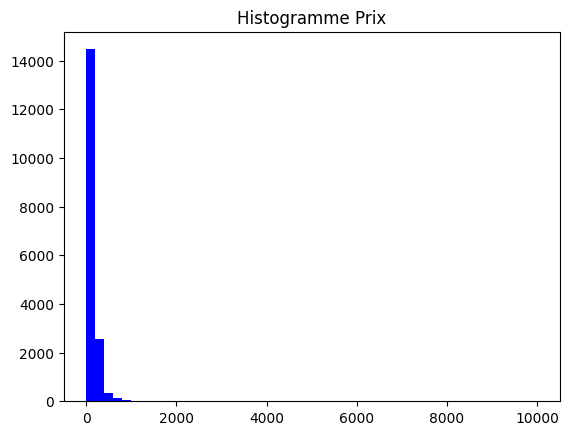

In [12]:
plt.figure()
plt.hist(data['price'], bins=50, color="blue")
plt.title("Histogramme Prix")

In [63]:
#data.loc[data['price'].idxmax()]

In [6]:
q = data["price"].quantile(0.95)
print(q)
dataf = data[data["price"] < q]

333.0


Text(0.5, 1.0, 'Histogramme Prix Filtré q=95%')

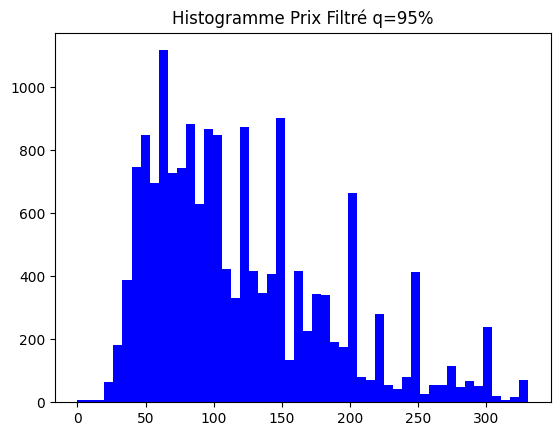

In [7]:
plt.figure()
plt.hist(dataf['price'], bins=50, color="blue")
plt.title("Histogramme Prix Filtré q=95%")

*Minimum Nights*

Text(0.5, 1.0, 'Histogramme Minimum Nights')

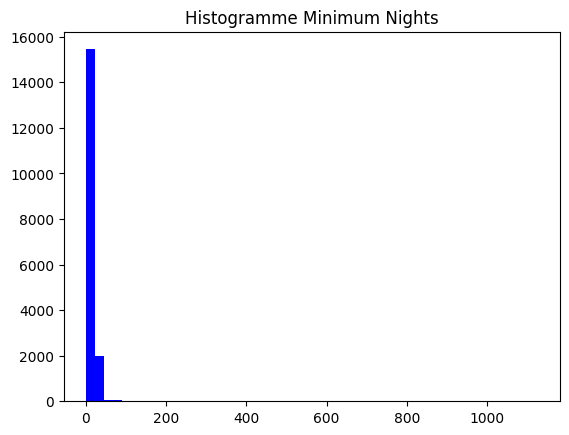

In [15]:
plt.figure()
plt.hist(data['minimum_nights'], bins=50, color="blue")
plt.title("Histogramme Minimum Nights")

In [8]:
q = data["minimum_nights"].quantile(0.95)
print(q)
dataf = data[data["minimum_nights"] < q]

30.0


Text(0.5, 1.0, 'Histogramme Minimum Nights Filtré q=95%')

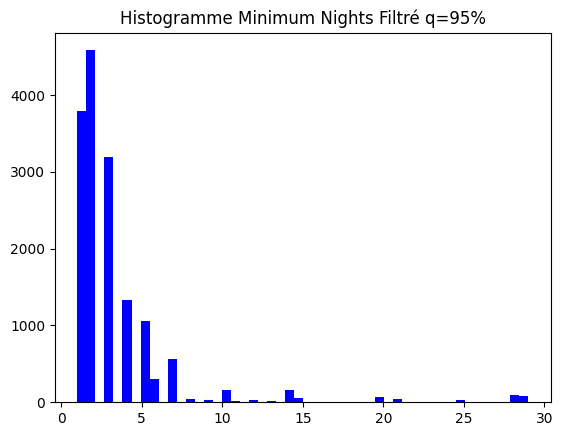

In [17]:
plt.figure()
plt.hist(dataf['minimum_nights'], bins=50, color="blue")
plt.title("Histogramme Minimum Nights Filtré q=95%")

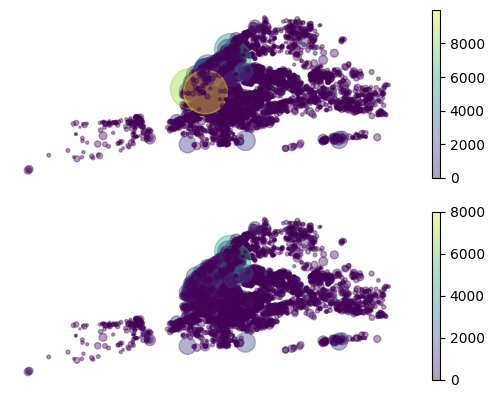

In [82]:
plt.figure()
plt.subplot(2,1,1)
plt.scatter(data['longitude'],data['latitude'], s=data['price']/10, c=data['price'],alpha=0.4)
plt.axis('off')
plt.colorbar()
plt.subplot(2,1,2)
plt.scatter(dataf['longitude'],dataf['latitude'], s=dataf['price']/10, c=dataf['price'],alpha=0.4)
plt.axis('off')
plt.colorbar()

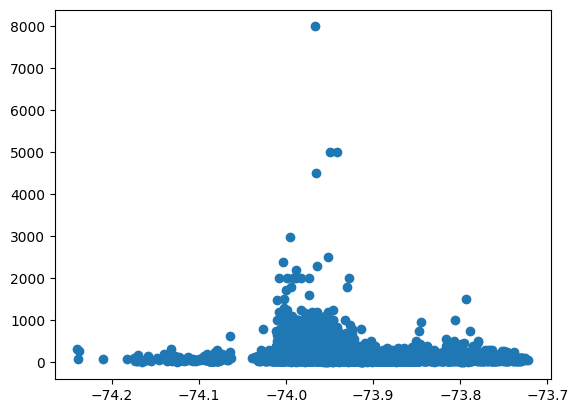

In [19]:
plt.figure()
plt.scatter(dataf['longitude'],dataf['price'])

### Subway

In [47]:
df_subway = pd.read_csv("C:/Users/c49082/PycharmProjects/pythonProject/data/SUBWAY_ENTRANCE.csv")

In [11]:
profile = ProfileReport(df_subway, title="Pandas Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [48]:
df_subway['the_geom'] = df_subway["the_geom"].str.strip("POINT ( ")
df_subway['the_geom'] = df_subway["the_geom"].str.strip(")")
df_subway['the_geom'] = df_subway["the_geom"].str.split()
df_subway["the_geom"].head()

0    [-73.86835600032798, 40.84916900104506]
1    [-73.86821300022677, 40.84912800131844]
2    [-73.87349900050798, 40.84122300105249]
3     [-73.8728919997833, 40.84145300067447]
4    [-73.87962300013866, 40.84081500075867]
Name: the_geom, dtype: object

In [72]:
df_subway['latitude'] = df_subway["the_geom"].str[0]
df_subway['longitude'] = df_subway["the_geom"].str[1]
df_subway["latitude"].head()

0    -73.86835600032798
1    -73.86821300022677
2    -73.87349900050798
3     -73.8728919997833
4    -73.87962300013866
Name: latitude, dtype: object

In [73]:
df_subway["longitude"].head()

0    40.84916900104506
1    40.84912800131844
2    40.84122300105249
3    40.84145300067447
4    40.84081500075867
Name: longitude, dtype: object

In [74]:
df_subway.head

,OBJECTID,URL,NAME,the_geom,LINE,latitude,longitude
0,1734,http://web.mta.info/nyct/service/,Birchall Ave & Sagamore St at NW corner,"[-73.86835600032798, 40.84916900104506]",2-5,-73.86835600032798,40.84916900104506
1,1735,http://web.mta.info/nyct/service/,Birchall Ave & Sagamore St at NE corner,"[-73.86821300022677, 40.84912800131844]",2-5,-73.86821300022677,40.84912800131844
2,1736,http://web.mta.info/nyct/service/,Morris Park Ave & 180th St at NW corner,"[-73.87349900050798, 40.84122300105249]",2-5,-73.87349900050798,40.84122300105249
3,1737,http://web.mta.info/nyct/service/,Morris Park Ave & 180th St at NW corner,"[-73.8728919997833, 40.84145300067447]",2-5,-73.8728919997833,40.84145300067447
4,1738,http://web.mta.info/nyct/service/,Boston Rd & 178th St at SW corner,"[-73.87962300013866, 40.84081500075867]",2-5,-73.87962300013866,40.84081500075867
...,...,...,...,...,...,...,...
1923,1928,http://web.mta.info/nyct/service/,2nd Ave & bet 83rd & 84th St,"[-73.95281423699555, 40.77618770946792]",Q,-73.95281423699555,40.77618770946792
1924,1929,http://web.mta.info/nyct/service/,2nd Ave & 96th St at SW corner,"[-73.94747299691045, 40.784098884955554]",Q,-73.94747299691045,40.784098884955554
1925,1930,http://web.mta.info/nyct/service/,2nd Ave & 95th St at NW corner,"[-73.94761889814153, 40.783916088309326]",Q,-73.94761889814153,40.783916088309326
1926,1931,http://web.mta.info/nyct/service/,2nd Ave & 94th St at NE corner,"[-73.94772938539093, 40.78292438898596]",Q,-73.94772938539093,40.78292438898596


In [84]:
property_coords = dataf['latitude','longitude'].to_numpy
station_coords = df_subway['latitude','longitude'].to_numpy

KeyError: ('latitude', 'longitude')

In [77]:
from sklearn.neighbors import KDTree, BallTree
# Create BallTree using station coordinates and specify distance metric
tree = BallTree(station_coords, metric = 'haversine')

print('PropertyID StationID Distance')
for i, property in enumerate(property_coords):
    dist, ind = tree.query(property.reshape(1, -1), k=1) # distance to first nearest station
    print(properties['propertyID'][i], stations['stationID'][ind[0][0]], dist[0][0], sep ='\t')

NameError: name 'sation_cords' is not defined

In [ ]:
print(df['distance'])

# Partie 3 - Préparer les données

### LabelEncoder

LabelEncoder va nous permettre de transformer les valeurs textuelles en entiers. Nous pouvons utiliser pour chaque variable qualitative :

In [160]:
encoder = LabelEncoder()
data["neighbourhood"] = encoder.fit_transform(data["neighbourhood"])

In [161]:
dict_label_encode={}
for col in data.columns:
    if data[col].dtype == object:
        dict_label_encode[col]=LabelEncoder()
        data[col]=dict_label_encode[col].fit_transform(data[col])

In [162]:
data

,F1,id,neighbourhood,latitude,longitude,room_type,price,days_occupied_in_2019,minimum_nights,number_of_reviews,reviews_per_month,availability_2020
0,0,2595,112,40.75362,-73.98377,0,225,15,10,48,0.39,1
1,1,3831,17,40.68514,-73.95976,0,89,188,1,295,4.67,1
2,2,5099,103,40.74767,-73.97500,0,200,362,3,78,0.60,19
3,3,5121,10,40.68688,-73.95596,2,60,0,29,49,0.38,365
4,4,5178,103,40.76489,-73.98493,2,79,141,2,454,3.52,242
...,...,...,...,...,...,...,...,...,...,...,...,...
17609,28313,23691588,17,40.69312,-73.94073,3,32,9,31,5,0.26,1
17610,17415,14712466,17,40.65446,-73.92613,3,99,7,100,1,0.03,0
17611,27827,23184420,102,40.71172,-73.98864,3,41,14,180,2,0.12,365
17612,29127,24555212,103,40.71113,-73.98840,3,38,0,180,1,0.27,365


### LabelBinarizer

In [140]:
encoder = LabelBinarizer()

In [141]:
dict_label_encode={}
for col in data.columns:
    if data[col].dtype == object:
        dict_label_encode[col]=LabelBinarizer()
        data[col]=dict_label_encode[col].fit_transform(data[col])

In [174]:
data

,F1,id,neighbourhood,latitude,longitude,room_type,price,days_occupied_in_2019,minimum_nights,number_of_reviews,reviews_per_month,availability_2020
0,0,2595,Midtown,40.75362,-73.98377,Entire home/apt,225,15,10,48,0.39,1
1,1,3831,Brooklyn,40.68514,-73.95976,Entire home/apt,89,188,1,295,4.67,1
2,2,5099,Manhattan,40.74767,-73.97500,Entire home/apt,200,362,3,78,0.60,19
3,3,5121,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,0,29,49,0.38,365
4,4,5178,Manhattan,40.76489,-73.98493,Private room,79,141,2,454,3.52,242
...,...,...,...,...,...,...,...,...,...,...,...,...
17609,28313,23691588,Brooklyn,40.69312,-73.94073,Shared room,32,9,31,5,0.26,1
17610,17415,14712466,Brooklyn,40.65446,-73.92613,Shared room,99,7,100,1,0.03,0
17611,27827,23184420,Lower East Side,40.71172,-73.98864,Shared room,41,14,180,2,0.12,365
17612,29127,24555212,Manhattan,40.71113,-73.98840,Shared room,38,0,180,1,0.27,365


### OneHot

In [86]:
# nous stockons d'abord le nom des colonnes quantitatives
numeric_features = ['latitude', 'longitude', 'days_occupied_in_2019', 'minimum_nights', 
                    'number_of_reviews', 'reviews_per_month', 'availability_2020']

# nous appliquons à ces colonnes une transformation
numeric_transformer = StandardScaler()
    
# nous stockons d'abord le nom des colonnes qualitatives
categorical_features = ['neighbourhood', 'room_type']
# nous appliquons à ces colonnes une OneHot
categorical_transformer = OneHotEncoder(handle_unknown='ignore', categories='auto')

# on combine toutes ces informations dans un objet de la classe ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)]
)

In [87]:
# on applique les transformations sur toutes les colonnes
data_clean = preprocessor.fit_transform(data)

In [88]:
data_clean

<17614x197 sparse matrix of type '<class 'numpy.float64'>'
	with 158526 stored elements in Compressed Sparse Row format>

# Dummies

In [4]:
data_clean = pd.get_dummies(data)
data_clean

,F1,id,latitude,longitude,price,days_occupied_in_2019,minimum_nights,number_of_reviews,reviews_per_month,availability_2020,...,neighbourhood_Williamsbridge,neighbourhood_Williamsburg,neighbourhood_Windsor Terrace,neighbourhood_Woodhaven,neighbourhood_Woodlawn,neighbourhood_Woodside,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room
0,0,2595,40.75362,-73.98377,225,15,10,48,0.39,1,...,0,0,0,0,0,0,1,0,0,0
1,1,3831,40.68514,-73.95976,89,188,1,295,4.67,1,...,0,0,0,0,0,0,1,0,0,0
2,2,5099,40.74767,-73.97500,200,362,3,78,0.60,19,...,0,0,0,0,0,0,1,0,0,0
3,3,5121,40.68688,-73.95596,60,0,29,49,0.38,365,...,0,0,0,0,0,0,0,0,1,0
4,4,5178,40.76489,-73.98493,79,141,2,454,3.52,242,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17609,28313,23691588,40.69312,-73.94073,32,9,31,5,0.26,1,...,0,0,0,0,0,0,0,0,0,1
17610,17415,14712466,40.65446,-73.92613,99,7,100,1,0.03,0,...,0,0,0,0,0,0,0,0,0,1
17611,27827,23184420,40.71172,-73.98864,41,14,180,2,0.12,365,...,0,0,0,0,0,0,0,0,0,1
17612,29127,24555212,40.71113,-73.98840,38,0,180,1,0.27,365,...,0,0,0,0,0,0,0,0,0,1


In [7]:
names = list(data_clean.columns)

In [8]:
names.pop(0)
names.pop(0)
names.pop(2)
names

['latitude',
 'longitude',
 'days_occupied_in_2019',
 'minimum_nights',
 'number_of_reviews',
 'reviews_per_month',
 'availability_2020',
 'neighbourhood_Allerton',
 'neighbourhood_Alphabet City',
 'neighbourhood_Annadale',
 'neighbourhood_Astoria',
 'neighbourhood_Bath Beach',
 'neighbourhood_Battery Park City',
 'neighbourhood_Bay Ridge',
 'neighbourhood_Baychester',
 'neighbourhood_Bayside',
 'neighbourhood_Bedford Park',
 'neighbourhood_Bedford-Stuyvesant',
 'neighbourhood_Bensonhurst',
 'neighbourhood_Bergen Beach',
 'neighbourhood_Boerum Hill',
 'neighbourhood_Borough Park',
 'neighbourhood_Brighton Beach',
 'neighbourhood_Bronxdale',
 'neighbourhood_Brooklyn',
 'neighbourhood_Brooklyn Heights',
 'neighbourhood_Brooklyn Navy Yard',
 'neighbourhood_Brownsville',
 'neighbourhood_Bushwick',
 'neighbourhood_Canarsie',
 'neighbourhood_Carroll Gardens',
 'neighbourhood_Castle Hill',
 'neighbourhood_Chelsea',
 'neighbourhood_Chinatown',
 'neighbourhood_City Island',
 'neighbourhood_Civi

In [9]:
# nous stockons d'abord le nom des colonnes quantitatives
numeric_features = ['latitude', 'longitude', 'days_occupied_in_2019', 'minimum_nights', 
                    'number_of_reviews', 'reviews_per_month', 'availability_2020']
# nous appliquons à ces colonnes une transformation
numeric_transformer = StandardScaler()

id_features = ['F1', 'id','price']
id_transformer = 'drop'

# on combine toutes ces informations dans un objet de la classe ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('id', id_transformer, id_features)],remainder='passthrough')


In [10]:
data_clean = preprocessor.fit_transform(data_clean)
data_clean

array([[ 0.47149335, -0.71772537, -1.26359279, ...,  0.        ,
         0.        ,  0.        ],
       [-0.73034275, -0.23954689,  0.06514941, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.3670698 , -0.54306376,  1.4015722 , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [-0.26385906, -0.81471535, -1.27127338, ...,  0.        ,
         0.        ,  1.        ],
       [-0.27421366, -0.80993555, -1.37880165, ...,  0.        ,
         0.        ,  1.        ],
       [-0.26508757, -0.78364669, -0.4264084 , ...,  0.        ,
         0.        ,  1.        ]])

### Pipeline

In [331]:
class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attributes_names].values

In [182]:
num_attribs = [ 'latitude', 'longitude', 'days_occupied_in_2019', 'minimum_nights', 
                    'number_of_reviews', 'reviews_per_month', 'availability_2020']
cat_attribs = ['neighbourhood', 'room_type']

num_pipeline = Pipeline([('selector',DataFrameSelector(num_attribs)),('std_scaler', StandardScaler())])
cat_pipeline = Pipeline([('selector',DataFrameSelector(cat_attribs)),('one_hot', OneHotEncoder())])
full_pipeline = FeatureUnion(transformer_list=[(('num_pipeline',num_pipeline),('cat_pipeline',cat_pipeline))])

In [261]:
data_prepared = full_pipeline.fit_transform(data)
data_prepared

### train_test_split

In [11]:
x = data_clean
y = data["price"]

x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = 0.2)

# Courbes d'apprentissage

In [318]:
def plot_learning_curves(model, X, y):
    x_train, x_test, y_train, y_test = train_test_split(X,y,test_size = 0.2)
    train_errors, test_errors = [], []
    for m in range(1, int((x_train.shape[0])/10)):
        n = 10 * m
        model.fit(x_train[:n], y_train[:n])
        y_train_predict = model.predict(x_train[:n])
        y_test_predict = model.predict(x_test)
        train_errors.append((mean_squared_error(y_train_predict, y_train[:n])))
        test_errors.append((mean_squared_error(y_test_predict, y_test)))
    plt.figure()
    plt.plot(np.sqrt(train_errors), "r-+", linewidth=2, label="train")
    plt.plot(np.sqrt(test_errors), "b-", linewidth=3, label="test")
    plt.legend(['Train', 'Test'])
    plt.xlabel('Taille du jeu d entrainement', fontsize=10)
    plt.ylabel('RMSE', fontsize=10)

# Partie 4 - Sélectioner et entrainer un modèle

## Linear Regression

In [333]:
lin_reg = LinearRegression()
lin_reg.fit(x_train,y_train)

LinearRegression()

In [334]:
(mean_squared_error(lin_reg.predict(x_test), y_test))**(1/2)

138936875724.1408

In [335]:
(mean_squared_error(lin_reg.predict(x_train), y_train))**(1/2)

190.31019344795695

In [336]:
lin_reg.score(x_test, y_test)

-7.88174936551945e+17

In [337]:
#plt.figure()
#plt.scatter(y_test,lin_reg.predict(x_test))

In [338]:
plot_learning_curves(lin_reg, x, y)

KeyboardInterrupt: 

## Polynomial Regression

Polynomial regression is a linear model used for describing non-linear relationships.

In [350]:
poly = PolynomialFeatures(degree=2, include_bias=False)

In [351]:
poly_train_features = poly.fit_transform(x_train)

### **Without** regularization coefficient :

In [352]:
poly_reg_model = LinearRegression()

In [353]:
poly_reg_model.fit(poly_train_features, y_train)

LinearRegression()

In [354]:
poly_test_features = poly.fit_transform(x_test)

In [355]:
(np.mean((poly_reg_model.predict(poly_test_features) - y_test)**2))**(1/2)

143.08194305215193

In [356]:
(mean_squared_error(poly_reg_model.predict(poly_train_features), y_train))**(1/2)

182.86269543326716

In [357]:
#plt.figure()
#plt.scatter(y_test,poly_reg_model.predict(poly_test_features))

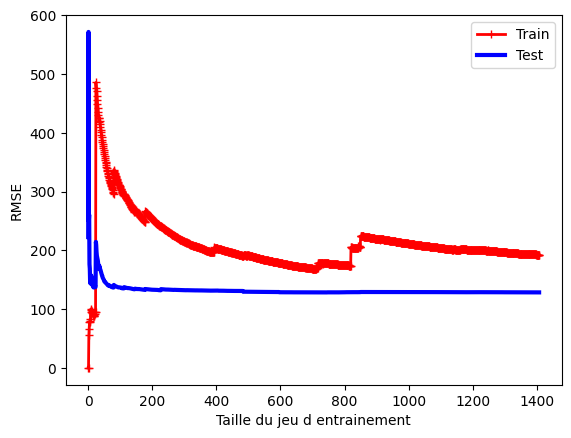

In [358]:
plot_learning_curves(poly_reg_model, x, y)

### **With** regularization coefficient :

La régularisation consiste en général à imposer des contraintes aux coefficients de pondération du modèle

Ridge Regression

In [359]:
poly_reg_model = Ridge(alpha=10)

In [360]:
poly_reg_model.fit(poly_features, y_train)

Ridge(alpha=10)

In [361]:
poly_test_features = poly.fit_transform(x_test)

In [362]:
(np.mean((poly_reg_model.predict(poly_test_features) - y_test)**2))**(1/2)

157.2571974950762

In [363]:
(mean_squared_error(poly_reg_model.predict(poly_train_features), y_train))**(1/2)

205.75659731612836

In [364]:
#plt.figure()
#plt.scatter(y_test,poly_reg_model.predict(poly_test_features))

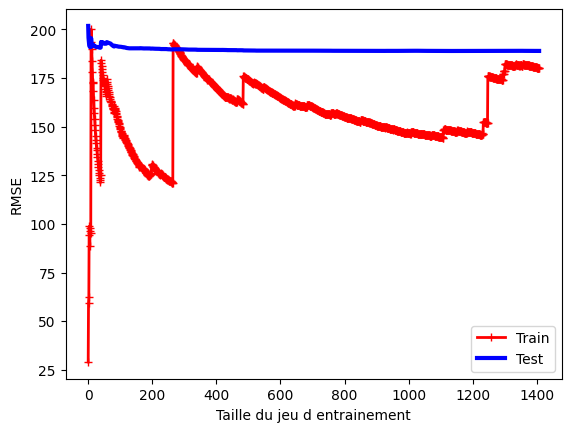

In [365]:
plot_learning_curves(poly_reg_model, x, y)

Lasso Regression

In [366]:
poly_reg_model = Lasso(alpha=0.5)

In [367]:
poly_reg_model.fit(poly_features, y_train)

Lasso(alpha=0.5)

In [368]:
poly_test_features = poly.fit_transform(x_test)

In [369]:
(np.mean((poly_reg_model.predict(poly_test_features) - y_test)**2))**(1/2)

153.63427075216492

In [370]:
(mean_squared_error(poly_reg_model.predict(poly_train_features), y_train))**(1/2)

203.711914369518

In [371]:
#plt.figure()
#plt.scatter(y_test,poly_reg_model.predict(poly_test_features))

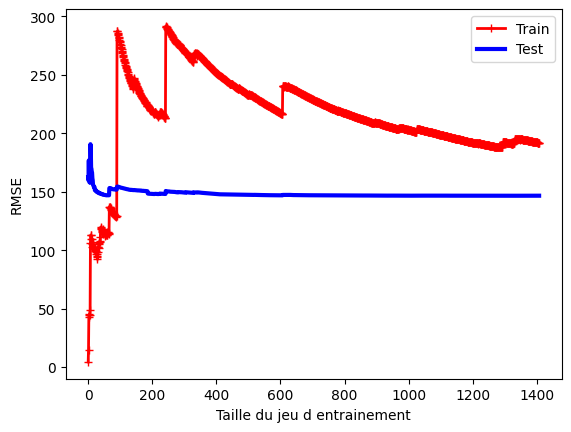

In [372]:
plot_learning_curves(poly_reg_model, x, y)

Ridge Regression - Cross Validation

In [376]:
poly_reg_model = RidgeCV()
poly_reg_model.fit(poly_features, y_train)

RidgeCV()

In [377]:
poly_test_features = poly.fit_transform(x_test)

In [378]:
(np.mean((poly_reg_model.predict(poly_test_features) - y_test)**2))**(1/2)

157.25620612315564

In [379]:
(mean_squared_error(poly_reg_model.predict(poly_train_features), y_train))**(1/2)

205.75582832850654

In [380]:
#plt.figure()
#plt.scatter(y_test,poly_reg_model.predict(poly_test_features))

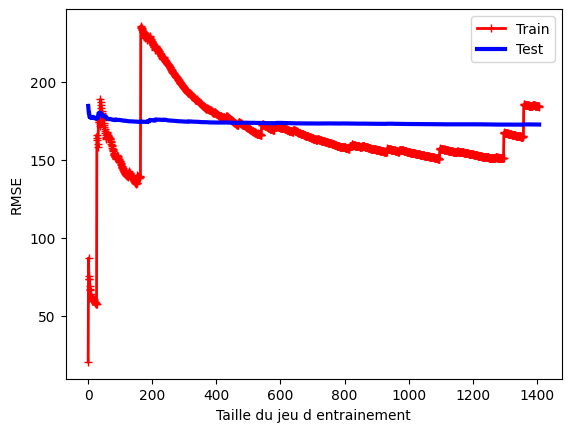

In [381]:
plot_learning_curves(poly_reg_model, x, y)

Lasso Regression - Cross Validation

In [260]:
poly_reg_model = LassoCV()
poly_reg_model.fit(poly_features, y_train)

In [ ]:
poly_test_features = poly.fit_transform(x_test)

In [ ]:
(np.mean((poly_reg_model.predict(poly_test_features) - y_test)**2))**(1/2)

In [ ]:
plt.figure()
plt.scatter(y_test,poly_reg_model.predict(poly_test_features))

# Arbres de décision

In [295]:
tree_regressor = DecisionTreeRegressor(
    random_state=0, 
    max_leaf_nodes=20,
    min_samples_leaf=50,
    max_depth=10)

In [296]:
tree_regressor.fit(x_train,y_train)

DecisionTreeRegressor(max_depth=10, max_leaf_nodes=20, min_samples_leaf=50,
                      random_state=0)

In [297]:
(mean_squared_error(tree_regressor.predict(x_test), y_test))**(1/2)

134.28473387657627

In [298]:
(mean_squared_error(tree_regressor.predict(x_train), y_train))**(1/2)

187.47951492549478

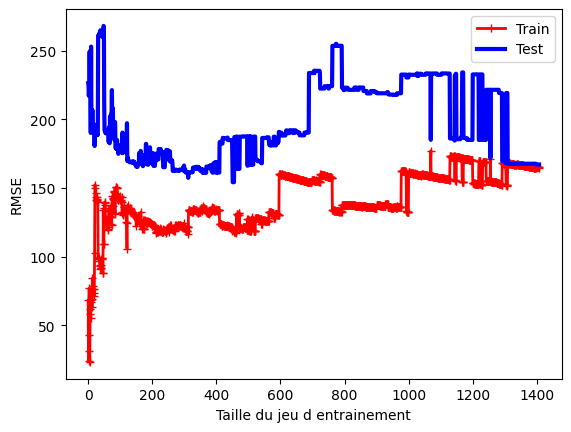

In [88]:
plot_learning_curves(tree_regressor, x, y)

# Forêts Aléatoires 

In [402]:
forest_regressor = RandomForestRegressor(n_estimators=200, random_state=0)

In [404]:
forest_regressor.fit(x_train,y_train)

In [142]:
(mean_squared_error(forest_regressor.predict(x_test), y_test))**(1/2)

175.61470665374353

In [143]:
(mean_squared_error(forest_regressor.predict(x_train), y_train))**(1/2)

65.66613111638782

In [146]:
#plot_learning_curves(forest_regressor, x, y)

In [144]:
importances = forest_regressor.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest_regressor.estimators_], axis=0)

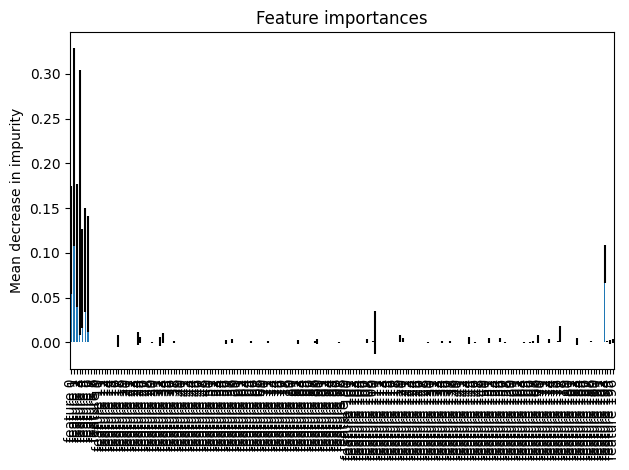

In [148]:
forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

In [155]:
y_predict = forest_regressor.predict(x)

Text(0.5, 0, 'Longitude')

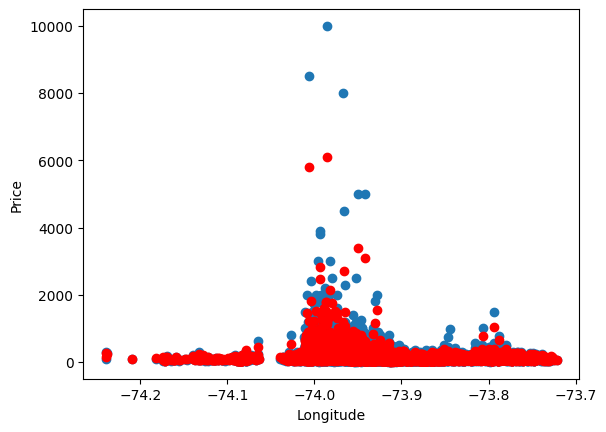

In [158]:
plt.figure()
plt.scatter(data['longitude'],data['price'])
plt.scatter(data['longitude'],y_predict,color='red')
plt.ylabel("Price")
plt.xlabel('Longitude')

Text(0.5, 0, 'Latitude')

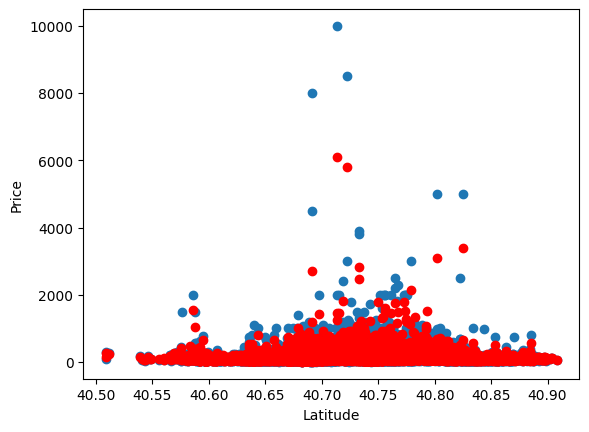

In [189]:
plt.figure()
plt.scatter(data['latitude'],data['price'])
plt.scatter(data['latitude'],y_predict,color='red')
plt.ylabel("Price")
plt.xlabel('Latitude')

Text(0.5, 1.0, 'Histogramme Prix')

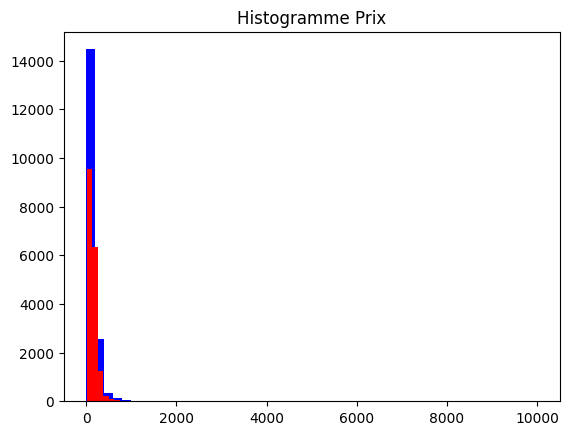

In [159]:
plt.figure()
plt.hist(data['price'], bins=50, color="blue")
plt.hist(y_predict, bins=50, color="red")
plt.title("Histogramme Prix")

In [238]:
var = data[data['price']<2500]
var_clean = preprocessor.fit_transform(var)
x_var = var_clean
y_var = var["price"]

In [ ]:
y_var_predict = forest_regressor.predict(x_var)

In [242]:
(mean_squared_error(y_var_predict, y_var))**(1/2)

66.22109200528185

Text(0.5, 0, 'Longitude')

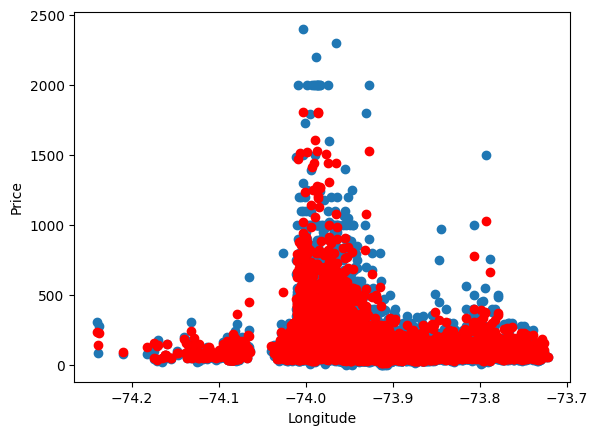

In [243]:
plt.figure()
plt.scatter(var['longitude'],var['price'])
plt.scatter(var['longitude'],y_var_predict,color='red')
plt.ylabel("Price")
plt.xlabel('Longitude')

### Price < 2500

In [183]:
x_train2, x_test2, y_train2, y_test2 = train_test_split(x_var,y_var,test_size = 0.2)

In [184]:
forest_regressor2 = RandomForestRegressor(n_estimators=300, random_state=0)

In [186]:
forest_regressor2.fit(x_train2,y_train2)

RandomForestRegressor(n_estimators=300, random_state=0)

In [187]:
(mean_squared_error(forest_regressor2.predict(x_test2), y_test2))**(1/2)

102.33176878812924

In [252]:
(mean_squared_error(forest_regressor2.predict(x_train2), y_train2))**(1/2)

40.336228227754546

Text(0.5, 0, 'Longitude')

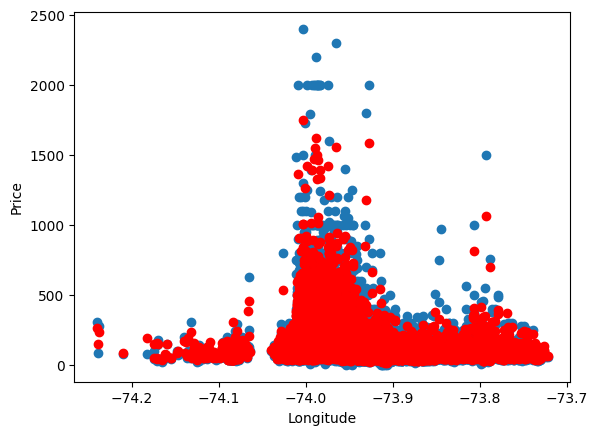

In [192]:
plt.figure()
plt.scatter(var['longitude'],var['price'])
plt.scatter(var['longitude'],forest_regressor2.predict(x_var),color='red')
plt.ylabel("Price")
plt.xlabel('Longitude')

### Grid Search - Forêts Aléatoires 

In [417]:
grid = {'n_estimators': [300],
       'max_features': ['sqrt'],
       'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
       'random_state' : [0],
       'max_leaf_nodes': [5, 30, None]}

In [420]:
CV_rfr = GridSearchCV(estimator=RandomForestRegressor(), param_grid=grid, n_jobs = -1)

In [421]:
CV_rfr.fit(x_train, y_train)

GridSearchCV(estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'max_features': ['sqrt'],
                         'max_leaf_nodes': [5, 30, None], 'n_estimators': [300],
                         'random_state': [0]})

In [422]:
CV_rfr.best_params_

{'max_depth': 10,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'n_estimators': 300,
 'random_state': 0}

In [423]:
best_grid = CV_rfr.best_estimator_

In [424]:
(mean_squared_error(best_grid.predict(x_test), y_test))**(1/2)

224.93567325454308

In [425]:
(mean_squared_error(best_grid.predict(x_train), y_train))**(1/2)

136.9853418355707

Errors : [  TEST  ,   TRAIN  ]

In [426]:
[mean_squared_error(best_grid.predict(x_test), y_test, squared=False),
mean_squared_error(best_grid.predict(x_train), y_train, squared=False)]

[224.93567325454308, 136.9853418355707]

In [427]:
[mean_absolute_error(y_test, best_grid.predict(x_test)),
mean_absolute_error(y_train,  best_grid.predict(x_train))]

[61.27097955927213, 56.293384755440606]

In [428]:
[mean_absolute_percentage_error(y_test, best_grid.predict(x_test)),
mean_absolute_percentage_error(y_train,  best_grid.predict(x_train))]

[311979766907028.06, 128676102972377.27]

### Gradient Tree Boosting

In [390]:
gbrt = GradientBoostingRegressor(max_depth=6, n_estimators=100, learning_rate = 0.1)

In [395]:
gbrt.fit(x_train,y_train)

GradientBoostingRegressor(max_depth=6)

In [396]:
(mean_squared_error(gbrt.predict(x_test), y_test))**(1/2)

215.3304899576325

In [397]:
(mean_squared_error(gbrt.predict(x_train), y_train))**(1/2)

80.73478761882139

In [398]:
y_predict = gbrt.predict(x)

Text(0.5, 0, 'Longitude')

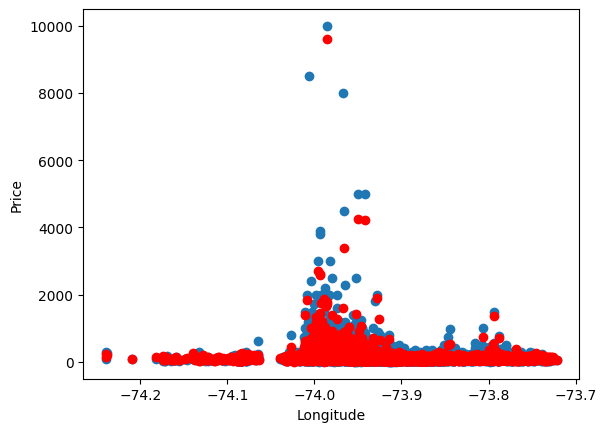

In [399]:
plt.figure()
plt.scatter(data['longitude'],data['price'])
plt.scatter(data['longitude'],y_predict,color='red')
plt.ylabel("Price")
plt.xlabel('Longitude')

### Grid Search - Gradient Tree Boosting

In [403]:
grid = {'n_estimators': [100, 200, 300],
       'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
       'learning_rate' : [0.05, 0.1, 0.15, 0.2]}

In [404]:
#CV_gbrt = GridSearchCV(estimator=GradientBoostingRegressor(), param_grid=grid, n_jobs = -1)

In [409]:
CV_gbrt = RandomizedSearchCV(gbrt, grid, n_jobs = -1)

In [410]:
CV_gbrt.fit(x_train, y_train)

RandomizedSearchCV(estimator=GradientBoostingRegressor(max_depth=6), n_jobs=-1,
                   param_distributions={'learning_rate': [0.05, 0.1, 0.15, 0.2],
                                        'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                      10],
                                        'n_estimators': [100, 200, 300]})

In [411]:
CV_gbrt.best_params_

{'n_estimators': 200, 'max_depth': 3, 'learning_rate': 0.05}

In [412]:
best_grid = CV_gbrt.best_estimator_

Errors : [  TEST  ,   TRAIN  ]

In [414]:
[mean_squared_error(best_grid.predict(x_test), y_test, squared=False),
mean_squared_error(best_grid.predict(x_train), y_train, squared=False)]

[224.43603560310933, 128.66123890454443]

In [415]:
[mean_absolute_error(y_test, best_grid.predict(x_test)),
mean_absolute_error(y_train,  best_grid.predict(x_train))]

[58.83393842399367, 54.750801305185874]

In [416]:
[mean_absolute_percentage_error(y_test, best_grid.predict(x_test)),
mean_absolute_percentage_error(y_train,  best_grid.predict(x_train))]

[292551018021438.7, 93524778931553.8]

### AdaBoostRegressor - Forêts Aléatoires 

In [366]:
Ada_rfr = AdaBoostRegressor(estimator=RandomForestRegressor(), random_state=0)

In [367]:
Ada_rfr.fit(x_train, y_train)

KeyboardInterrupt: 

In [362]:
(mean_squared_error(Ada_rfr.predict(x_test), y_test))**(1/2)

239.72206380649604

In [363]:
(mean_squared_error(Ada_rfr.predict(x_train), y_train))**(1/2)

18.397709578304237

# XGBoost

In [78]:
# Create regression matrices
dtrain_reg = xgb.DMatrix(x_train, y_train)
dtest_reg = xgb.DMatrix(x_test, y_test)

In [118]:
# Define hyperparameters
params = {
    "objective": "reg:squarederror",
    'eta': 0.15,
    'max_depth': 5,
    'min_child_weight': 1,
    'subsample': 1}

In [119]:
evals = [(dtrain_reg, "train"), (dtest_reg, "validation")]

In [120]:
n = 1000
model = xgb.train(
   params=params,
   dtrain=dtrain_reg,
   num_boost_round=n,
   evals=evals,
   verbose_eval=20, # Every ten rounds
   early_stopping_rounds=20
)

[0]	train-rmse:228.74786	validation-rmse:200.72137
[20]	train-rmse:133.63558	validation-rmse:143.17825
[40]	train-rmse:117.48967	validation-rmse:141.57835
[60]	train-rmse:109.87427	validation-rmse:140.82772
[80]	train-rmse:101.24232	validation-rmse:141.22104
[84]	train-rmse:99.98118	validation-rmse:141.37194


In [121]:
mean_squared_error(y_test, model.predict(dtest_reg), squared=False)

141.3566945926315

In [122]:
mean_squared_error(y_train,  model.predict(dtrain_reg), squared=False)

99.80259637240796

<AxesSubplot: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

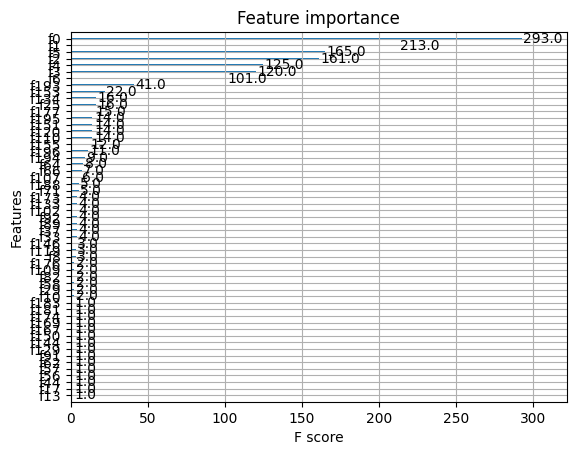

In [69]:
xgb.plot_importance(model)

In [346]:
results = xgb.cv(
   params, dtrain_reg,
   num_boost_round=n,
   nfold=5,
   early_stopping_rounds=20
)

In [347]:
results.head()

,train-rmse-mean,train-rmse-std,test-rmse-mean,test-rmse-std
0,236.706260,11.654086,235.022742,46.300572
1,225.597680,11.526082,226.245843,47.659669
2,215.754144,11.367224,218.613367,49.026709
3,207.096952,11.174151,212.292206,50.017308
4,199.583295,10.860518,207.092008,50.992691


In [348]:
best_rmse = results['test-rmse-mean'].min()
best_rmse

181.2834619986812

Text(0.5, 0, 'Longitude')

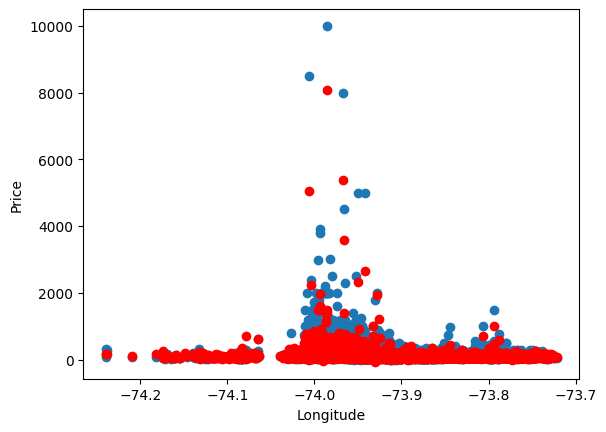

In [349]:
d_reg = xgb.DMatrix(x, y)
y_predict = model.predict(d_reg)
plt.figure()
plt.scatter(data['longitude'],data['price'])
plt.scatter(data['longitude'],y_predict,color='red')
plt.ylabel("Price")
plt.xlabel('Longitude')

### Grid Search - XGBoost

In [17]:
estimator = xgb.XGBRegressor(objective = "reg:squarederror")

In [18]:
grid = {"eta": [0.01, 0.05, 0.1, 0.15, 0.2],
       'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]}

In [19]:
CV_xgb = GridSearchCV(
    estimator=estimator, 
    param_grid=grid,
    n_jobs = -1,
    verbose=True
)

In [20]:
CV_xgb.fit(x_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


GridSearchCV(estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None, gpu_id=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, max_bi...,
                                    max_cat_threshold=None,
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None, n_estimators=100,
                                    n_jobs=None, num_parallel_tree=None,
                                    predictor=None, random_state=None, ...),
             n_jobs=-1,
             param_grid={'eta': [0.01, 0.05, 0.1, 0.15, 0.2],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]},
             verbose=True)

In [21]:
CV_xgb.best_params_

{'eta': 0.1, 'max_depth': 5}

In [22]:
best_xgb = CV_xgb.best_estimator_

In [23]:
mean_squared_error(best_xgb.predict(x_test), y_test, squared=False)

138.1502652503194

In [24]:
mean_squared_error(best_xgb.predict(x_train), y_train, squared=False)

110.63327709618605

In [33]:
grid = {"eta": [0.05, 0.1, 0.15],
       'max_depth': [5],
       "subsample" : [1],
       "min_child_weight" : [1] }

In [34]:
CV_xgb = GridSearchCV(
    estimator=estimator, 
    param_grid=grid,
    n_jobs = -1,
    cv = 5,
    verbose=True
)

In [35]:
CV_xgb.fit(x_train, y_train)

Fitting 5 folds for each of 3 candidates, totalling 15 fits


GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None, gpu_id=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    max_cat_threshold=None,
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None, n_estimators=100,
                                    n_jobs=None, num_parallel_tree=None,
                                    predictor=None, random_state=None, ...),
             n_jobs=-1,
             param_grid={'eta': [0.05, 0.1, 0.15], 'max_depth': [5],
                         'min_child_weight': [1], 'subsample': [1]},
             verbose=True)

In [36]:
best_params = CV_xgb.best_params_
best_params

{'eta': 0.1, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 1}

In [37]:
best_xgb = CV_xgb.best_estimator_

In [38]:
#best_xgb.save_model('model.json')

In [39]:
#best_xgb = xgb.Booster()
#best_xgb.load_model("model.json")

In [40]:
out_cv_xgb = pd.DataFrame.from_dict(CV_xgb.cv_results_, orient='columns')
out_cv_xgb.sort_values(by=['mean_test_score'], ascending=False)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_eta,param_max_depth,param_min_child_weight,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
1,11.002023,0.173341,0.027052,0.004722,0.1,5,1,1,"{'eta': 0.1, 'max_depth': 5, 'min_child_weight...",0.246015,0.237492,0.332750,0.075273,0.233903,0.225087,0.083313,1
0,10.987028,0.152490,0.029825,0.002783,0.05,5,1,1,"{'eta': 0.05, 'max_depth': 5, 'min_child_weigh...",0.270058,0.242956,0.297408,0.068986,0.210136,0.217909,0.079882,2
2,7.867863,2.627634,0.021919,0.006291,0.15,5,1,1,"{'eta': 0.15, 'max_depth': 5, 'min_child_weigh...",0.190249,0.232085,0.317261,0.119161,0.217057,0.215163,0.064111,3


Errors : [  TEST  ,   TRAIN  ]

In [41]:
[mean_squared_error(best_xgb.predict(x_test), y_test, squared=False),
mean_squared_error(best_xgb.predict(x_train), y_train, squared=False)]

[138.1502652503194, 110.63327709618605]

In [42]:
[mean_absolute_error(y_test, best_xgb.predict(x_test)),
mean_absolute_error(y_train,  best_xgb.predict(x_train))]

[53.691151600956005, 50.26034620373153]

In [43]:
[mean_absolute_percentage_error(y_test, best_xgb.predict(x_test)),
mean_absolute_percentage_error(y_train,  best_xgb.predict(x_train))]

[66068427373718.08, 148485574609865.66]

Text(0.5, 0, 'Longitude')

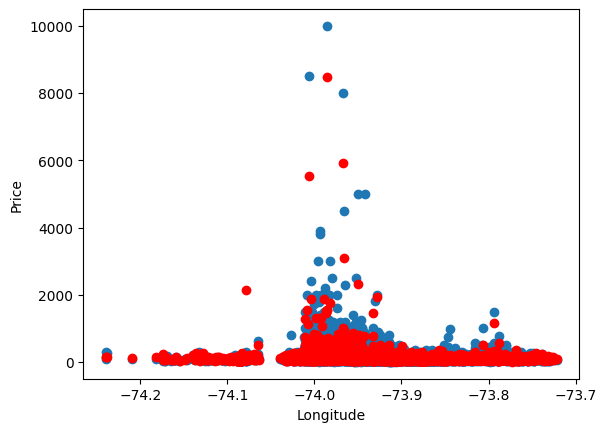

In [44]:
plt.figure()
plt.scatter(data['longitude'],data['price'])
plt.scatter(data['longitude'],best_xgb.predict(x),color='red')
plt.ylabel("Price")
plt.xlabel('Longitude')

# Shap

In [30]:
explainer = shap.TreeExplainer(best_xgb)

In [31]:
d_reg = xgb.DMatrix(x, y)
shap_values = explainer.shap_values(d_reg)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


In [32]:
shap_exp = explainer(x)

In [33]:
pred = best_xgb.predict(x, output_margin=True)
np.abs(shap_values.sum(1) + explainer.expected_value - pred).max()

0.0009765625

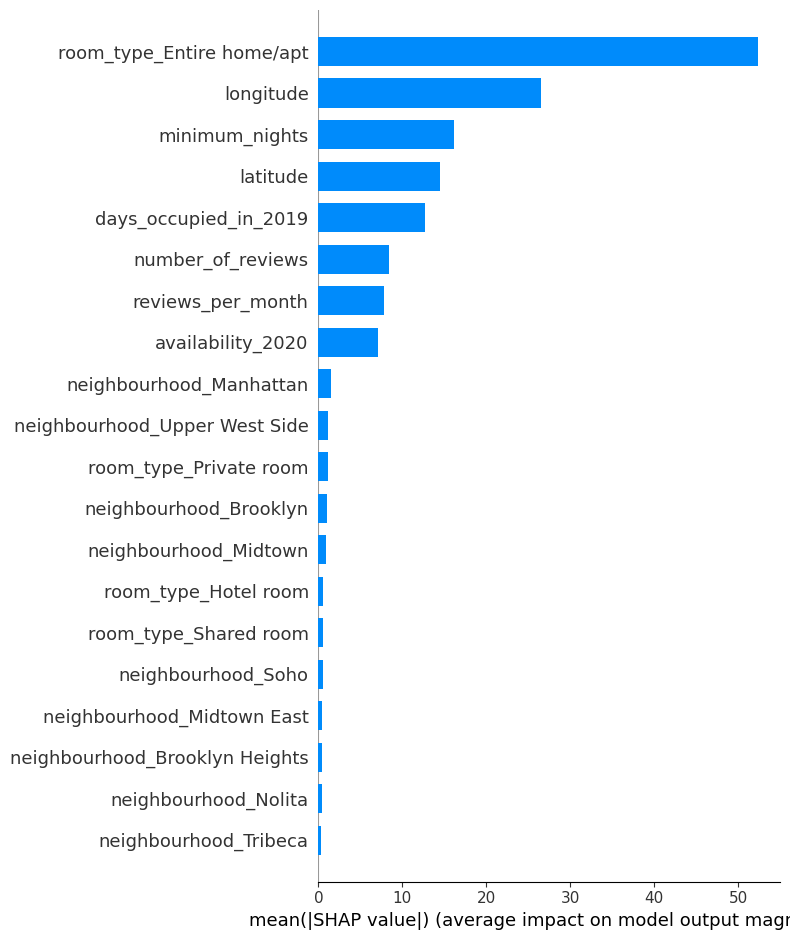

In [34]:
shap.summary_plot(shap_values, x, names, plot_type="bar")

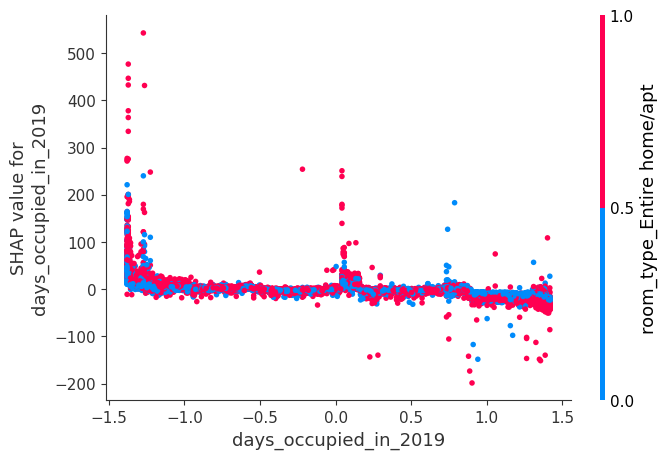

In [35]:
shap.dependence_plot(2, shap_values, x, feature_names=names)

In [36]:
# compute SHAP values
explainer = shap.TreeExplainer(best_xgb, x,feature_names=names)
shap_values = explainer(x)

 97%|=================== | 17152/17614 [00:33<00:00]       

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


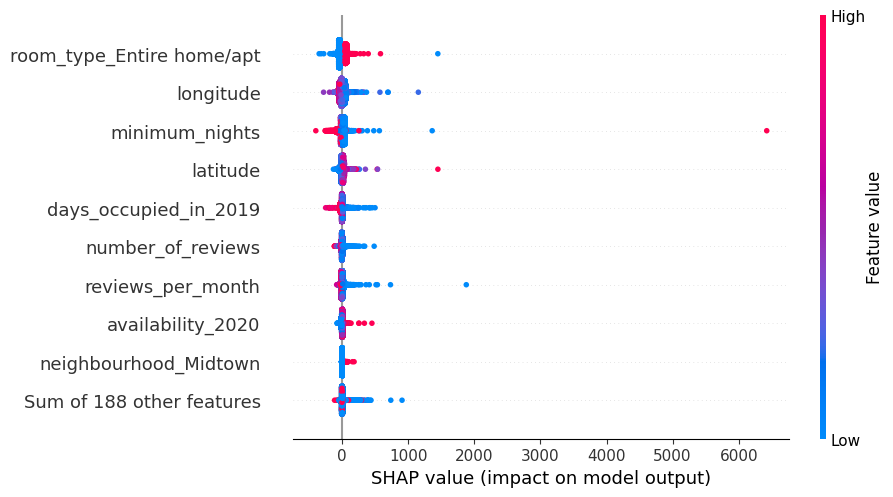

In [37]:
shap.plots.beeswarm(shap_values)

In [38]:
explainer = shap.TreeExplainer(best_xgb, x,feature_names=names)
shap_values = explainer(x)

 97%|=================== | 17115/17614 [00:33<00:00]       

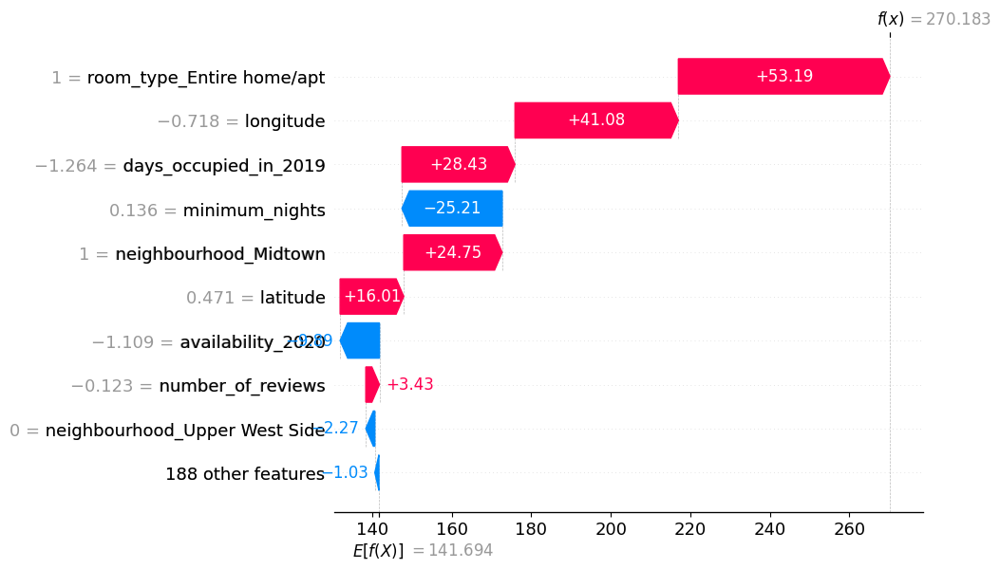

In [39]:
shap.plots.waterfall(shap_values[0])

# Synthèse

In [2]:
def pipe(data):
    data_clean = pd.get_dummies(data)
    
    names = list(data_clean.columns)
    numeric_features = ['latitude', 'longitude', 'days_occupied_in_2019', 'minimum_nights', 
                        'number_of_reviews', 'reviews_per_month', 'availability_2020']
    numeric_transformer = StandardScaler()
    id_features = ['F1', 'id','price']
    id_transformer = 'drop'
    # on combine toutes ces informations dans un objet de la classe ColumnTransformer
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features),
            ('id', id_transformer, id_features)],remainder='passthrough')
    return preprocessor.fit_transform(data_clean)

In [3]:
def calculate_errors(model,x_train, y_train, x_test, y_test) :
    mse_test=mean_squared_error(y_test, model.predict(x_test), squared=False)
    mse_train=mean_squared_error(y_train,  model.predict(x_train), squared=False)
    mae_test=mean_absolute_error(y_test, model.predict(x_test))
    mae_train=mean_absolute_error(y_train,  model.predict(x_train))
    mape_test=mean_absolute_percentage_error(y_test, model.predict(x_test))
    mape_train=mean_absolute_percentage_error(y_train,  model.predict(x_train))
    return [mse_test, mse_train, mae_test, mae_train, mape_test, mape_train]

In [4]:
def compare_models(x_train, x_test, y_train, y_test):
    errors=[]
   
    ### XGBoost
    print('XGBoost')
    start = timeit.default_timer()
    # Create regression matrices
    dtrain_reg = xgb.DMatrix(x_train, y_train)
    dtest_reg = xgb.DMatrix(x_test, y_test)
    # Define hyperparameters
    params = {"objective": "reg:squarederror",'eta': 0.15,'max_depth': 6,'min_child_weight': 1,'subsample': 1}
    evals = [(dtrain_reg, "train"), (dtest_reg, "validation")]
    model_xgboost = xgb.train(params=params,dtrain=dtrain_reg,num_boost_round=1000,evals=evals,verbose_eval=False,early_stopping_rounds=20)
    stop = timeit.default_timer()
    ## Calculate Errors : 
    xgboost_errors = calculate_errors(model_xgboost,dtrain_reg,y_train,dtest_reg,y_test)
    errors.append({'mse_test': xgboost_errors[0], 'mse_train': xgboost_errors[1], 'mae_test': xgboost_errors[2], 'mae_train': xgboost_errors[3], 'mape_test': xgboost_errors[4], 'mape_train': xgboost_errors[5], 'Time' :  (stop - start)})

    ### Gradient Tree Boosting
    print('Gradient Tree Boosting')
    start = timeit.default_timer()
    model_gbr = GradientBoostingRegressor(max_depth=3, n_estimators=100, learning_rate = 0.05)
    model_gbr.fit(x_train, y_train)
    stop = timeit.default_timer()
    ## Calculate Errors : 
    gbr_errors = calculate_errors(model_gbr,x_train,y_train,x_test,y_test)
    errors.append({'mse_test': gbr_errors[0], 'mse_train': gbr_errors[1], 'mae_test': gbr_errors[2], 'mae_train': gbr_errors[3], 'mape_test': gbr_errors[4], 'mape_train': gbr_errors[5], 'Time' :  (stop - start)})

    ### Forêts Aléatoires
    print('Forêts Aléatoires')
    start = timeit.default_timer()
    model_rfr = RandomForestRegressor(n_estimators=300, random_state=0, max_depth=10, max_features='sqrt')
    model_rfr.fit(x_train, y_train)
    stop = timeit.default_timer()
    ## Calculate Errors : 
    rfr_errors = calculate_errors(model_rfr,x_train,y_train,x_test,y_test)
    errors.append({'mse_test': rfr_errors[0], 'mse_train': rfr_errors[1], 'mae_test': rfr_errors[2], 'mae_train': rfr_errors[3], 'mape_test': rfr_errors[4], 'mape_train': rfr_errors[5], 'Time' :  (stop - start)})
    
    ### Arbres de décision
    print('Arbres de décision')
    start = timeit.default_timer()
    model_dtr = DecisionTreeRegressor(random_state=0,max_leaf_nodes=20,min_samples_leaf=50,max_depth=10)
    model_dtr.fit(x_train, y_train)
    stop = timeit.default_timer()
    ## Calculate Errors : 
    dtr_errors = calculate_errors(model_dtr,x_train,y_train,x_test,y_test)
    errors.append({'mse_test': dtr_errors[0], 'mse_train': dtr_errors[1], 'mae_test': dtr_errors[2], 'mae_train': dtr_errors[3], 'mape_test': dtr_errors[4], 'mape_train': dtr_errors[5], 'Time' :  (stop - start)})
    
    ### Ridge
    print('Ridge')
    start = timeit.default_timer()
    poly = PolynomialFeatures(degree=2, include_bias=False)
    poly_train_features = poly.fit_transform(x_train)
    poly_test_features = poly.fit_transform(x_test)
    model_ridge = Ridge(alpha=10)
    model_ridge.fit(poly_train_features, y_train)
    stop = timeit.default_timer()
    ## Calculate Errors : 
    ridge_errors = calculate_errors(model_ridge,poly_train_features,y_train,poly_test_features,y_test)
    errors.append({'mse_test': ridge_errors[0], 'mse_train': ridge_errors[1], 'mae_test': ridge_errors[2], 'mae_train': ridge_errors[3], 'mape_test': ridge_errors[4], 'mape_train': ridge_errors[5], 'Time' :  (stop - start)})
    
    ### Lasso
    print('Lasso')
    start = timeit.default_timer()
    poly = PolynomialFeatures(degree=2, include_bias=False)
    poly_train_features = poly.fit_transform(x_train)
    poly_test_features = poly.fit_transform(x_test)
    model_lasso = Lasso(alpha=0.5)
    model_lasso.fit(poly_train_features, y_train)
    stop = timeit.default_timer()
    ## Calculate Errors : 
    lasso_errors = calculate_errors(model_lasso,poly_train_features,y_train,poly_test_features,y_test)
    errors.append({'mse_test': lasso_errors[0], 'mse_train': lasso_errors[1], 'mae_test': lasso_errors[2], 'mae_train': lasso_errors[3], 'mape_test': lasso_errors[4], 'mape_train': lasso_errors[5], 'Time' :  (stop - start)})
    
#     ### Polynomial 
#     print('Polynomial')
#     start = timeit.default_timer()
#     poly = PolynomialFeatures(degree=2, include_bias=False)
#     poly_train_features = poly.fit_transform(x_train)
#     poly_test_features = poly.fit_transform(x_test)
#     model_poly = LinearRegression()
#     model_poly.fit(poly_train_features, y_train)
#     stop = timeit.default_timer()
#     ## Calculate Errors : 
#     poly_errors = calculate_errors(model_poly,poly_train_features,y_train,poly_test_features,y_test)
#     errors.append({'mse_test': poly_errors[0], 'mse_train': poly_errors[1], 'mae_test': poly_errors[2], 'mae_train': poly_errors[3], 'mape_test': poly_errors[4], 'mape_train': poly_errors[5], 'Time' :  (stop - start)})
    
    ### Linear 
    print('Linear')
    start = timeit.default_timer()
    model_lin = LinearRegression()
    model_lin.fit(x_train, y_train)
    stop = timeit.default_timer()
    ## Calculate Errors : 
    lin_errors = calculate_errors(model_lin,x_train,y_train,x_test,y_test)
    errors.append({'mse_test': lin_errors[0], 'mse_train': lin_errors[1], 'mae_test': lin_errors[2], 'mae_train': lin_errors[3], 'mape_test': lin_errors[4], 'mape_train': lin_errors[5], 'Time' :  (stop - start)})
    

    # Creates DataFrame.
    tableau = pd.DataFrame(errors, index=['XGBoost','Gradient Tree Boosting', 'Forêts Aléatoires', 'Arbres de décision', 'Ridge', 'Lasso', 'Linear'])
    return tableau


In [9]:
data = pd.read_csv("C:/Users/c49082/PycharmProjects/pythonProject/data/NY Realstate Pricing.csv")
df = pipe(data)
x = df
y = data["price"]
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = 0.2)

In [10]:
tableau = compare_models(x_train, x_test, y_train, y_test)

XGBoost
Gradient Tree Boosting
Forêts Aléatoires
Arbres de décision
Ridge
Lasso
Linear


In [11]:
tableau

,mse_test,mse_train,mae_test,mae_train,mape_test,mape_train,Time
XGBoost,1.273455e+02,81.460157,5.441082e+01,42.860906,3.902518e-01,1.549515e+14,1.840340
Gradient Tree Boosting,1.394104e+02,158.324446,5.804011e+01,57.323090,4.357707e-01,1.773248e+14,8.597151
Forêts Aléatoires,1.376976e+02,150.997791,5.963023e+01,56.583417,4.880667e-01,2.036252e+14,3.990756
Arbres de décision,1.391855e+02,186.162073,6.011337e+01,61.344426,4.528537e-01,1.867010e+14,0.123705
Ridge,1.395124e+02,185.542687,6.065375e+01,60.297600,4.594842e-01,1.372995e+14,47.671544
Lasso,1.412926e+02,189.587898,6.055574e+01,62.218421,4.657251e-01,1.769035e+14,17.885239
Linear,3.839609e+11,190.276813,1.204612e+10,63.058206,1.914336e+08,1.631812e+14,0.186626


In [12]:
tableau.sort_values(by=['mse_test'])

,mse_test,mse_train,mae_test,mae_train,mape_test,mape_train,Time
XGBoost,1.273455e+02,81.460157,5.441082e+01,42.860906,3.902518e-01,1.549515e+14,1.840340
Forêts Aléatoires,1.376976e+02,150.997791,5.963023e+01,56.583417,4.880667e-01,2.036252e+14,3.990756
Arbres de décision,1.391855e+02,186.162073,6.011337e+01,61.344426,4.528537e-01,1.867010e+14,0.123705
Gradient Tree Boosting,1.394104e+02,158.324446,5.804011e+01,57.323090,4.357707e-01,1.773248e+14,8.597151
Ridge,1.395124e+02,185.542687,6.065375e+01,60.297600,4.594842e-01,1.372995e+14,47.671544
Lasso,1.412926e+02,189.587898,6.055574e+01,62.218421,4.657251e-01,1.769035e+14,17.885239
Linear,3.839609e+11,190.276813,1.204612e+10,63.058206,1.914336e+08,1.631812e+14,0.186626


# ----------------------------------------------------------------------------

# Autre BDD

In [442]:
df = pd.read_csv("C:/Users/c49082/PycharmProjects/pythonProject/data/AB_NYC_2019.csv")

In [95]:
df.isna().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [96]:
df.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [443]:
profile = ProfileReport(df, title="Pandas Profiling Report")

In [444]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [445]:
df=df.dropna()

In [446]:
df.isna().sum()

id                                0
name                              0
host_id                           0
host_name                         0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

In [462]:
# nous stockons d'abord le nom des colonnes quantitatives
numeric_features = ['latitude', 'longitude', 'minimum_nights', 'number_of_reviews', 
                    'reviews_per_month', 'calculated_host_listings_count', 'availability_365',]
# nous appliquons à ces colonnes une transformation
numeric_transformer = StandardScaler()
    
# nous stockons d'abord le nom des colonnes qualitatives
categorical_features = ['neighbourhood','last_review']
# nous appliquons à ces colonnes une OneHot
categorical_transformer = OneHotEncoder(handle_unknown='ignore', categories='auto')

# on combine toutes ces informations dans un objet de la classe ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)]
)

In [463]:
df_clean = preprocessor.fit_transform(df)

In [464]:
df_clean

<38821x1989 sparse matrix of type '<class 'numpy.float64'>'
	with 349389 stored elements in Compressed Sparse Row format>

In [465]:
x = df_clean
y = df["price"]

x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = 0.2)

### Decision Tree Regressor

In [63]:
tree_regressor = DecisionTreeRegressor(
    random_state=0,
    min_samples_leaf=10)

In [64]:
tree_regressor.fit(x_train,y_train)

DecisionTreeRegressor(min_samples_leaf=10, random_state=0)

In [65]:
(mean_squared_error(tree_regressor.predict(x_test), y_test))**(1/2)

151.53255781217146

In [66]:
(mean_squared_error(tree_regressor.predict(x_train), y_train))**(1/2)

168.52138428224816

#### Grid Search - Tree Regressor

In [80]:
grid = {'max_features': ['sqrt', 1.0],
       'max_depth': [3,4, None],
       'random_state' : [0],
       'max_leaf_nodes': [5, 10, 15, 20, 25, 30],
       'min_samples_leaf': [1, 5, 10, 15, 20]}

In [81]:
CV_tr = GridSearchCV(estimator=DecisionTreeRegressor(), param_grid=grid)

In [82]:
CV_tr.fit(x_train, y_train)

GridSearchCV(estimator=DecisionTreeRegressor(),
             param_grid={'max_depth': [3, 4, None],
                         'max_features': ['sqrt', 1.0],
                         'max_leaf_nodes': [5, 10, 15, 20, 25, 30],
                         'min_samples_leaf': [1, 5, 10, 15, 20],
                         'random_state': [0]})

In [83]:
CV_tr.best_params_

{'max_depth': None,
 'max_features': 1.0,
 'max_leaf_nodes': 30,
 'min_samples_leaf': 20,
 'random_state': 0}

In [84]:
best_grid = CV_tr.best_estimator_

In [85]:
(mean_squared_error(best_grid.predict(x_test), y_test))**(1/2)

147.68605031575748

In [86]:
(mean_squared_error(best_grid.predict(x_train), y_train))**(1/2)

183.84634892736287

### Random Forest Regressor

In [308]:
forest_regressor = RandomForestRegressor(n_estimators=300, random_state=0)

In [309]:
forest_regressor.fit(x_train,y_train)

RandomForestRegressor(n_estimators=300, random_state=0)

In [311]:
(mean_squared_error(forest_regressor.predict(x_test), y_test))**(1/2)

170.94521863807506

In [312]:
(mean_squared_error(forest_regressor.predict(x_train), y_train))**(1/2)

74.10223688503746

#### Grid Search - Random Forest Regressor

In [316]:
grid = {'n_estimators': [200],
       'max_features': ['sqrt'],
       'max_depth': [3,4,5],
       'random_state' : [0],
       'max_leaf_nodes': [5, 15, 30],
       'min_samples_leaf': [1, 5, 10]}

In [317]:
CV_rfr = GridSearchCV(estimator=RandomForestRegressor(), param_grid=grid,n_jobs = -1)

In [318]:
CV_rfr.fit(x_train,y_train)

GridSearchCV(estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [3, 4, 5], 'max_features': ['sqrt'],
                         'max_leaf_nodes': [5, 15, 30],
                         'min_samples_leaf': [1, 5, 10], 'n_estimators': [200],
                         'random_state': [0]})

In [319]:
CV_rfr.best_params_

{'max_depth': 5,
 'max_features': 'sqrt',
 'max_leaf_nodes': 30,
 'min_samples_leaf': 10,
 'n_estimators': 200,
 'random_state': 0}

In [320]:
best_grid = CV_rfr.best_estimator_

In [321]:
(mean_squared_error(best_grid.predict(x_test), y_test))**(1/2)

172.87538091539906

In [322]:
(mean_squared_error(best_grid.predict(x_train), y_train))**(1/2)

199.7720661464939

# XGBoost

In [466]:
# Create regression matrices
dtrain_reg = xgb.DMatrix(x_train, y_train)
dtest_reg = xgb.DMatrix(x_test, y_test)

In [467]:
# Define hyperparameters
params = {
    "objective": "reg:squarederror",
    'eta': 0.1,
    'max_depth': 5,
    'min_child_weight': 1,
    'subsample': 0.9}

In [468]:
evals = [(dtrain_reg, "train"), (dtest_reg, "validation")]

In [469]:
n = 1000
model = xgb.train(
   params=params,
   dtrain=dtrain_reg,
   num_boost_round=n,
   evals=evals,
   verbose_eval=10, # Every ten rounds
   early_stopping_rounds=20
)

[0]	train-rmse:227.86476	validation-rmse:248.52535
[10]	train-rmse:171.67282	validation-rmse:213.18345
[20]	train-rmse:156.84556	validation-rmse:207.74130
[30]	train-rmse:149.30410	validation-rmse:206.47977
[40]	train-rmse:143.11489	validation-rmse:206.23608
[50]	train-rmse:138.05237	validation-rmse:206.46036
[58]	train-rmse:134.86437	validation-rmse:206.37433


Errors : [  TEST  ,   TRAIN  ]

In [470]:
[mean_squared_error(model.predict(dtest_reg), y_test, squared=False),
mean_squared_error(model.predict(dtrain_reg), y_train, squared=False)]

[206.3743331398766, 134.8643666165709]

In [471]:
[mean_absolute_error(y_test, model.predict(dtest_reg)),
mean_absolute_error(y_train,  model.predict(dtrain_reg))]

[67.80338920892935, 65.0437736546852]

In [472]:
[mean_absolute_percentage_error(y_test, model.predict(dtest_reg)),
mean_absolute_percentage_error(y_train,  model.predict(dtrain_reg))]

[158687714820904.7, 88027615065932.16]

### Grid Search - XGBoost

In [473]:
estimator = xgb.XGBRegressor(objective = "reg:squarederror")

In [474]:
grid = {"eta": [0.1],
       'max_depth': [1, 2, 3, 4, 5, 6],
       "subsample" : [ 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
       "min_child_weight" : [1, 2, 3, 4, 5, 6, 7, 8, 9] }

In [475]:
CV_xgb = GridSearchCV(
    estimator=estimator, 
    param_grid=grid,
    n_jobs = -1,
    verbose=True
)

In [476]:
CV_xgb.fit(x_train, y_train)

Fitting 5 folds for each of 324 candidates, totalling 1620 fits


GridSearchCV(estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None, gpu_id=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, max_bi...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None, n_estimators=100,
                                    n_jobs=None, num_parallel_tree=None,
                                    predictor=None, random_state=None, ...),
             n_jobs=-1,
             param_grid={'eta': [0.1], 'max_depth': [1, 2, 3, 4, 5, 6],
                         'min_child_weight': [1, 2, 3, 4, 5, 6, 7, 8, 9],
                         'subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]},
             verbose=True)

In [482]:
CV_xgb.best_params_

{'eta': 0.1, 'max_depth': 4, 'min_child_weight': 9, 'subsample': 0.5}

In [483]:
best_xgb = CV_xgb.best_estimator_

Errors : [  TEST  ,   TRAIN  ]

In [484]:
[mean_squared_error(best_xgb.predict(x_test), y_test, squared=False),
mean_squared_error(best_xgb.predict(x_train), y_train, squared=False)]

[204.4452326623053, 170.69237628322787]

In [485]:
[mean_absolute_error(y_test, best_xgb.predict(x_test)),
mean_absolute_error(y_train,  best_xgb.predict(x_train))]

[68.2525549399185, 67.5145081528249]

In [486]:
[mean_absolute_percentage_error(y_test, best_xgb.predict(x_test)),
mean_absolute_percentage_error(y_train,  best_xgb.predict(x_train))]

[153026097228099.16, 85252784065807.23]